In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()


import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

from wordcloud import WordCloud, STOPWORDS

!pip install sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

!pip install iso3166
from iso3166 import countries

In [2]:
july_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/July 2020/covidtweets.csv', lineterminator='\n')
july_tweets_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet\r
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False\r
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False\r
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False\r
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False\r
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False\r


In [3]:
july_tweets_df.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179108 entries, 0 to 179107
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         179108 non-null  object
 1   user_location     142337 non-null  object
 2   user_description  168822 non-null  object
 3   user_created      179108 non-null  object
 4   user_followers    179108 non-null  int64 
 5   user_friends      179108 non-null  int64 
 6   user_favourites   179108 non-null  int64 
 7   user_verified     179108 non-null  bool  
 8   date              179108 non-null  object
 9   text              179108 non-null  object
 10  hashtags          127774 non-null  object
 11  source            179031 non-null  object
       179108 non-null  object
dtypes: bool(1), int64(3), object(9)
memory usage: 16.6+ MB


In [4]:
july_tweets_df.describe()

,user_followers,user_friends,user_favourites
count,1.791080e+05,179108.000000,1.791080e+05
mean,1.090555e+05,2121.701566,1.444411e+04
std,8.414670e+05,9162.553072,4.452270e+04
min,0.000000e+00,0.000000,0.000000e+00
25%,1.720000e+02,148.000000,2.060000e+02
50%,9.920000e+02,542.000000,1.791000e+03
75%,5.284000e+03,1725.250000,9.388000e+03
max,4.944256e+07,497363.000000,2.047197e+06


In [5]:
print('Shape of tweets dataframe : {}'.format(july_tweets_df.shape))

Shape of tweets dataframe : (179108, 13)


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning:

Glyph 13 missing from current font.

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning:

Glyph 13 missing from current font.



<AxesSubplot:>

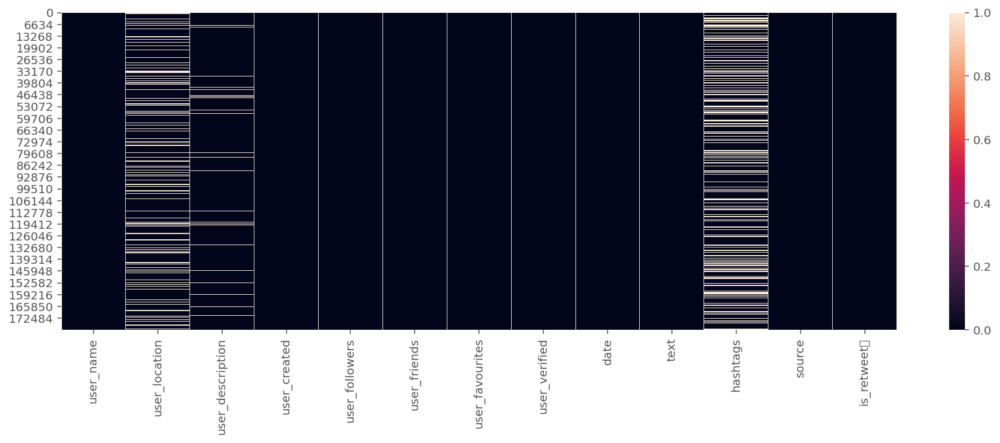

In [6]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(july_tweets_df.isnull())

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

def return_missing_values(data_frame):
    missing_values = data_frame.isnull().sum()/len(data_frame)
    missing_values = missing_values[missing_values>0]
    missing_values.sort_values(inplace=True)
    return missing_values

def plot_missing_values(data_frame):
    missing_values = return_missing_values(data_frame)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['Precentage']
    missing_values.index.names = ['Name']
    missing_values['Name'] = missing_values.index
    sns.set(style='whitegrid', color_codes=True)
    sns.barplot(x='Name', y='Precentage', data=missing_values)
    plt.xticks(rotation=90)
    plt.show()

In [8]:
return_missing_values(july_tweets_df)

source              0.000430
user_description    0.057429
user_location       0.205301
hashtags            0.286609
dtype: float64

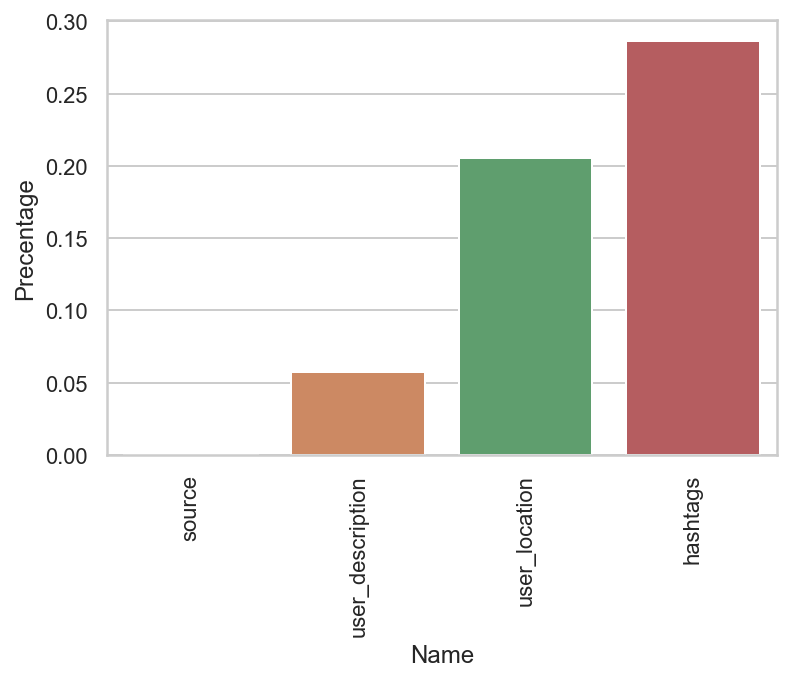

In [9]:
plot_missing_values(july_tweets_df)

In [10]:
july_tweets_df.corr()

,user_followers,user_friends,user_favourites,user_verified
user_followers,1.000000,-0.003580,-0.029218,0.320957
user_friends,-0.003580,1.000000,0.201050,0.012829
user_favourites,-0.029218,0.201050,1.000000,-0.061141
user_verified,0.320957,0.012829,-0.061141,1.000000


Text(0.5, 1.0, 'Correlation Heatmap')

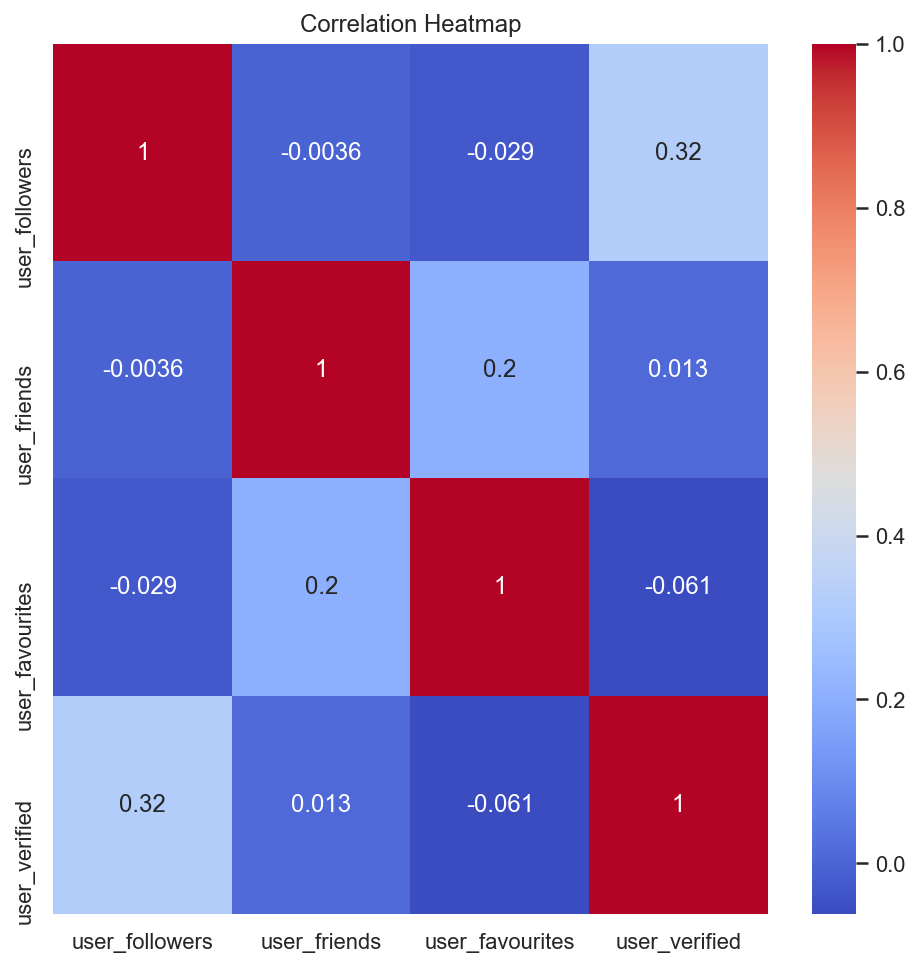

In [11]:
plt.figure(figsize=(8,8))
sns.heatmap(july_tweets_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [12]:
df_new = july_tweets_df['user_name'].value_counts().reset_index()
df_new.columns = ['user_name', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="user_name", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [13]:
export_csv = df_new.to_csv(r'tweet count.csv')

In [14]:
df_new.tail(10)

,user_name,tweets_count
9,ANI,233
8,IANS Tweets,244
7,Paperbirds_Coronavirus,259
6,IAM Platform,266
5,Hindustan Times,280
4,Blood Donors India,282
3,Open Letters,390
2,covidnews.ch,402
1,Coronavirus Updates,625
0,GlobalPandemic.NET,679


In [15]:
july_tweets_df = pd.merge(july_tweets_df, df_new, on='user_name')

In [16]:
july_tweets_df.head(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet\r,tweets_count
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False\r,2
1,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:25:24,I miss isopropyl alcohol so much!!!! Ethanol i...,['COVID19'],Twitter for iPhone,False\r,2
2,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False\r,1
3,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False\r,7
4,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9276,9526,7256,False,2020-07-25 04:32:59,"Seen enough ""errors"" to know the #COVID19 flar...",['COVID19'],Twitter for Android,False\r,7


In [17]:
data = july_tweets_df.sort_values('user_followers', ascending=False)
data = data.drop_duplicates(subset='user_name', keep="first")
data = data[['user_name', 'user_followers', 'tweets_count']]
data = data.sort_values('user_followers')

fig = px.bar(
    data.tail(20), 
    x="user_followers", 
    y="user_name", 
    color='tweets_count',
    orientation='h', 
    title='Top 20 users by number of followers', 
    width=800, 
    height=800
)

fig.show()

In [18]:
data.tail(5)

,user_name,user_followers,tweets_count
8457,The Times Of India,13057020,111
10963,NDTV,13568396,77
4279,CGTN,13892841,57
177274,National Geographic,24359165,1
140107,CNN,49442559,1


In [19]:
july_tweets_df['user_created'] = pd.to_datetime(july_tweets_df['user_created'])
july_tweets_df['year_created'] = july_tweets_df['user_created'].dt.year
data = july_tweets_df.drop_duplicates(subset='user_name', keep="first")
data = data[data['year_created']>1970]
data = data['year_created'].value_counts().reset_index()
data.columns = ['year', 'number']

fig = px.bar(
    data, 
    x="year", 
    y="number", 
    orientation='v', 
    title='User created year by year', 
    width=800, 
    height=600
)

fig.show()

In [20]:
data.head()

,year,number
0,2009,14158
1,2020,11512
2,2011,8698
3,2010,7645
4,2012,7354


In [21]:
ds = july_tweets_df['user_location'].value_counts().reset_index()
ds.columns = ['user_location', 'count']
ds = ds[ds['user_location']!='NA']
ds = ds.sort_values(['count'])

fig = px.bar(
    ds.tail(20), 
    x="count", 
    y="user_location", 
    orientation='h', title='Top 20 user locations by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [22]:
ds.head()

,user_location,count
13459,हिमालय से रामेश्वरम,1
17952,Port Macquarie NSW,1
17951,"Springfield, Illinois",1
17950,San Diego | Norwalk CT,1
17949,Tirupur,1


In [23]:
def pie_count(data, field, percent_limit, title):
    
    data[field] = data[field].fillna('NA')
    data = data[field].value_counts().to_frame()

    total = data[field].sum()
    data['percentage'] = 100 * data[field]/total    

    percent_limit = percent_limit
    otherdata = data[data['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = data[data['percentage'] >= percent_limit]

    data = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    data.loc[other_label] = pd.Series({field:otherdata[field].sum()}) 
    
    labels = data.index.tolist()   
    datavals = data[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)

    layout = go.Layout(
        title = title,
        height=600,
        width=600
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)
    
pie_count(july_tweets_df, 'user_location', 0.5, 'Number of tweets per location')

In [24]:
from string import punctuation
from nltk.corpus import stopwords
print(stopwords.words('english')[10:15])

def punctuation_stopwords_removal(sms):
    # filters charecter-by-charecter : ['h', 'e', 'e', 'l', 'o', 'o', ' ', 'm', 'y', ' ', 'n', 'a', 'm', 'e', ' ', 'i', 's', ' ', 'p', 'u', 'r', 'v', 'a']
    remove_punctuation = [ch for ch in sms if ch not in punctuation]
    # convert them back to sentences and split into words
    remove_punctuation = "".join(remove_punctuation).split()
    filtered_sms = [word.lower() for word in remove_punctuation if word.lower() not in stopwords.words('english')]
    return filtered_sms

["you've", "you'll", "you'd", 'your', 'yours']


In [25]:
from wordcloud import WordCloud, STOPWORDS


def draw_word_cloud(df, location, title):
    loc_df = df.loc[df.user_location==location]
    loc_df.loc[:, 'text'] = loc_df['text'].apply(punctuation_stopwords_removal)
    word_cloud = WordCloud(
                    background_color='black',
                    stopwords=set(STOPWORDS),
                    max_words=100,
                    max_font_size=50,
                    scale=5,
                    random_state=1).generate(str(loc_df['text']))
    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.imshow(word_cloud)
    plt.show()    

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



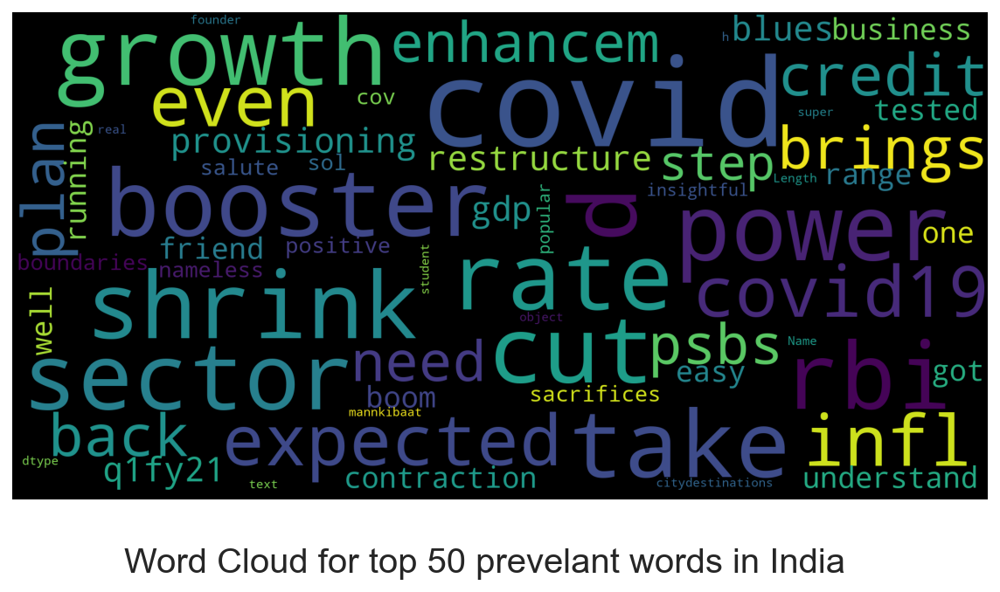

In [26]:
draw_word_cloud(july_tweets_df, 'India', 'Word Cloud for top 50 prevelant words in India')


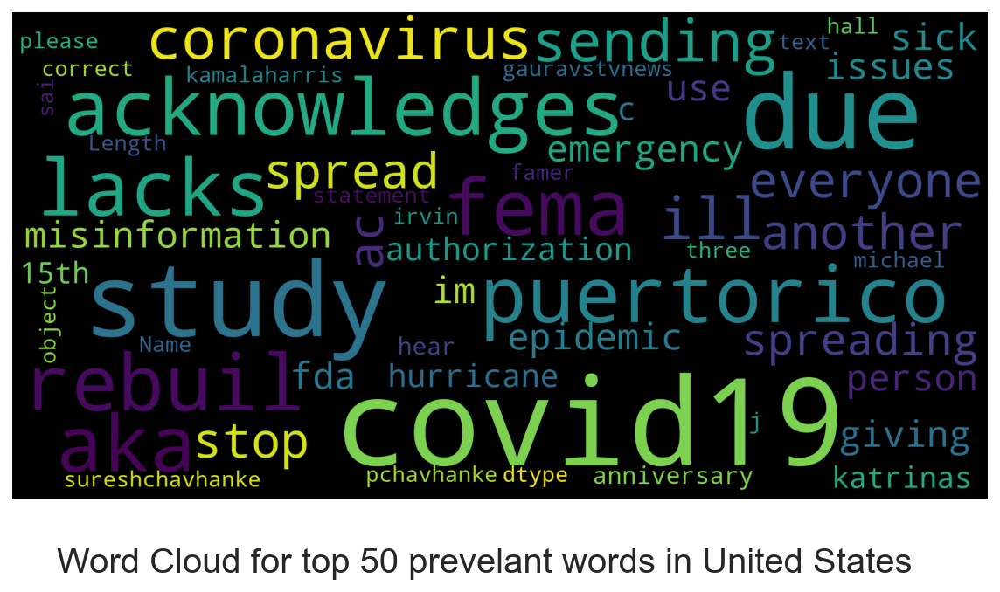

In [27]:
draw_word_cloud(july_tweets_df, 'United States', 'Word Cloud for top 50 prevelant words in United States')

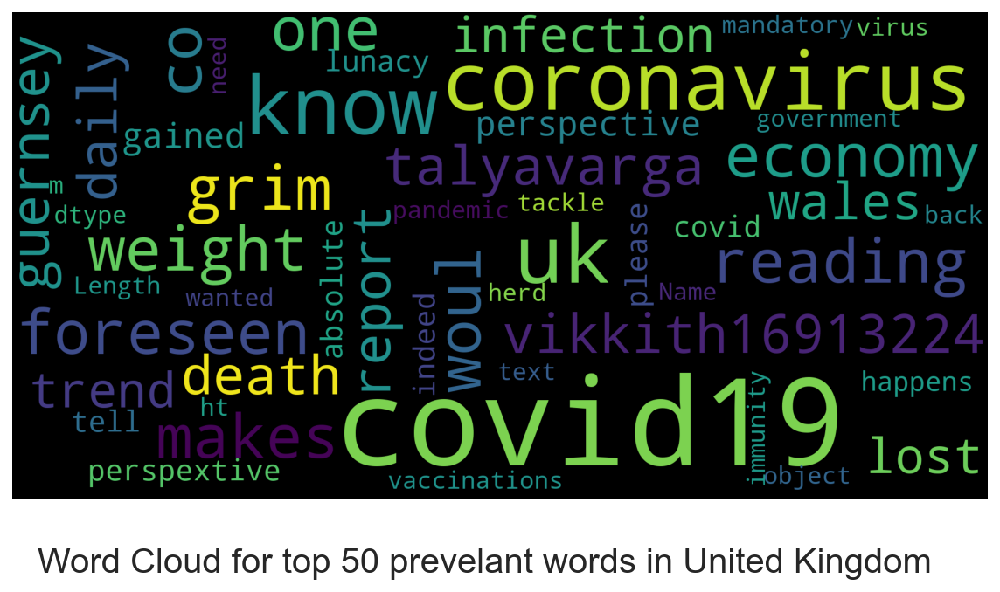

In [28]:
draw_word_cloud(july_tweets_df, 'United Kingdom', 'Word Cloud for top 50 prevelant words in United Kingdom')

In [29]:
july_tweets_df['hashtags'] = july_tweets_df['hashtags'].fillna('[]')
july_tweets_df['hashtags_count'] = july_tweets_df['hashtags'].apply(lambda x: len(x.split(',')))
july_tweets_df.loc[july_tweets_df['hashtags'] == '[]', 'hashtags_count'] = 0

july_tweets_df.head(10)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet\r,tweets_count,year_created,hashtags_count
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,[],Twitter for iPhone,False\r,2,2017,0
1,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:25:24,I miss isopropyl alcohol so much!!!! Ethanol i...,['COVID19'],Twitter for iPhone,False\r,2,2017,1
2,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,[],Twitter for Android,False\r,1,2009,0
3,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False\r,7,2009,1
4,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9276,9526,7256,False,2020-07-25 04:32:59,"Seen enough ""errors"" to know the #COVID19 flar...",['COVID19'],Twitter for Android,False\r,7,2009,1
5,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9274,9524,7276,False,2020-07-28 04:10:04,@protest_nyc Arrest these monsters for not soc...,['COVID19'],Twitter for Android,False\r,7,2009,1
6,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9274,9524,7276,False,2020-07-28 03:30:10,"@DNCWarRoom @realDonaldTrump Actually, it woul...",['COVID19'],Twitter for Android,False\r,7,2009,1
7,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9276,9532,7334,False,2020-08-04 04:03:00,@YossiGestetner The media just runs up one red...,['COVID19'],Twitter for Android,False\r,7,2009,1
8,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9234,9522,7403,False,2020-08-14 03:09:38,@drudgefeed @abcnews reported #COVID19 cases d...,['COVID19'],Twitter for Android,False\r,7,2009,1
9,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9231,9520,7426,False,2020-08-17 04:27:26,Hmmm... so this would suggest voting at the po...,['COVID19'],Twitter for Android,False\r,7,2009,1


In [30]:
july_tweets_df['hashtags_count'].describe()

count    179108.000000
mean          1.485104
std           1.563279
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max          17.000000
Name: hashtags_count, dtype: float64

In [31]:
#Just split day and time into separate columns

july_tweets_df['date'] = pd.to_datetime(july_tweets_df['date']) 
july_tweets_df = july_tweets_df.sort_values(['date'])
july_tweets_df['day'] = july_tweets_df['date'].astype(str).str.split(' ', expand=True)[0]
july_tweets_df['time'] = july_tweets_df['date'].astype(str).str.split(' ', expand=True)[1]
july_tweets_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet\r,tweets_count,year_created,hashtags_count,day,time
55192,Jessica Luther Rummel,"Denton, Texas",Mother. Partner. Scholar. Activist. Alchemist....,2020-07-05 03:28:16,234,28,220,False,2020-07-24 23:47:08,PROTESTORS NEEDED 6PM-10PM DAILY (NOW). 1450 E...,[],Twitter Web App,False\r,1,2020,0,2020-07-24,23:47:08
50894,Patty Hayes,"Seattle, WA",Director of Public Health - Seattle & King Cou...,2017-07-07 18:56:50,718,162,2276,False,2020-07-24 23:47:12,"Excellent partnership to prevent #COVID19, tha...",['COVID19'],Twitter for Android,False\r,2,2017,1,2020-07-24,23:47:12
55189,Clive Gorman,"Victoria, British Columbia",Marketing Director @CNEGames for @idlechampion...,2011-12-23 02:02:35,597,224,23824,False,2020-07-24 23:47:12,Don't take your eye off the ball. There are st...,['COVID19'],Twitter for Android,False\r,2,2011,1,2020-07-24,23:47:12
55191,Dr. Lipi #TrustDrFauci Roy,"New York, USA",@NBCNews @MSNBC @Forbes Medical Contributor | ...,2009-10-11 18:46:51,12485,4603,38120,True,2020-07-24 23:47:12,Always honored to speak w @NicolleDWallace abo...,['covid19'],Twitter Web App,False\r,1,2009,1,2020-07-24,23:47:12
55188,Tristyn Russelo,"Alberta, Canada",NaN,2017-06-14 22:01:54,5,68,57,False,2020-07-24 23:47:13,"Apparently, at the Timberlea @saveonfoods stor...",[],Twitter Web App,False\r,1,2017,0,2020-07-24,23:47:13


In [32]:
ds = july_tweets_df.groupby(['day', 'user_name'])['hashtags_count'].count().reset_index()
ds = ds.groupby(['day'])['user_name'].count().reset_index()
ds.columns = ['day', 'number_of_users']
ds['day'] = ds['day'].astype(str) + ':00:00:00'
fig = px.bar(
    ds, 
    x='day', 
    y="number_of_users", 
    orientation='v',
    title='Number of unique users per day', 
    width=800, 
    height=800
)
fig.show()

In [33]:
july_tweets_df['hour'] = july_tweets_df['date'].dt.hour
ds = july_tweets_df['hour'].value_counts().reset_index()
ds.columns = ['hour', 'count']
ds['hour'] = 'Hour ' + ds['hour'].astype(str)
fig = px.bar(
    ds, 
    x="hour", 
    y="count", 
    orientation='v', 
    title='Tweets distribution over hours', 
    width=800
)
fig.show()

In [34]:
july_tweets_df['location'] = july_tweets_df['user_location'].str.split(',', expand=True)[1].str.lstrip().str.rstrip()
res = july_tweets_df.groupby(['day', 'location'])['text'].count().reset_index()

In [35]:
country_dict = {}
for c in countries:
    country_dict[c.name] = c.alpha3
    
res['alpha3'] = res['location']
res = res.replace({"alpha3": country_dict})

country_list = ['England', 'United States', 'United Kingdom', 'London', 'UK']

res = res[
    (res['alpha3'] == 'USA') | 
    (res['location'].isin(country_list)) | 
    (res['location'] != res['alpha3'])
]

gbr = ['England', 'UK', 'London', 'United Kingdom']
us = ['United States', 'NY', 'CA', 'GA']

res = res[res['location'].notnull()]
res.loc[res['location'].isin(gbr), 'alpha3'] = 'GBR'
res.loc[res['location'].isin(us), 'alpha3'] = 'USA'
res.loc[res['alpha3'] == 'USA', 'location'] = 'USA'
res.loc[res['alpha3'] == 'GBR', 'location'] = 'United Kingdom'
plot = res.groupby(['day', 'location', 'alpha3'])['text'].sum().reset_index()
plot

,day,location,alpha3,text
0,2020-07-24,Australia,AUS,3
1,2020-07-24,Canada,CAN,5
2,2020-07-24,Colombia,COL,1
3,2020-07-24,India,IND,1
4,2020-07-24,Ireland,IRL,1
...,...,...,...,...
1439,2020-08-30,Uganda,UGA,9
1440,2020-08-30,United Arab Emirates,ARE,15
1441,2020-08-30,United Kingdom,GBR,205
1442,2020-08-30,Zambia,ZMB,1


In [36]:
fig = px.choropleth(
    plot, 
    locations="alpha3",
    hover_name='location',
    color="text",
    animation_frame='day',
    projection="natural earth",
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Tweets from different countries for every day',
    width=800, 
    height=600
)
fig.show()

In [37]:
res = july_tweets_df.groupby(['day', 'location', 'user_name'])['text'].count().reset_index()
res = res[['day', 'location', 'user_name']]
res['alpha3'] = res['location']
res = res.replace({"alpha3": country_dict})

country_list = ['England', 'United States', 'United Kingdom', 'London', 'UK']

res = res[
    (res['alpha3'] == 'USA') | 
    (res['location'].isin(country_list)) | 
    (res['location'] != res['alpha3'])
]

gbr = ['England', 'UK', 'London', 'United Kingdom']
us = ['United States', 'NY', 'CA', 'GA']

res = res[res['location'].notnull()]
res.loc[res['location'].isin(gbr), 'alpha3'] = 'GBR'
res.loc[res['location'].isin(us), 'alpha3'] = 'USA'
res.loc[res['alpha3'] == 'USA', 'location'] = 'USA'
res.loc[res['alpha3'] == 'GBR', 'location'] = 'United Kingdom'
plot = res.groupby(['day', 'location', 'alpha3'])['user_name'].count().reset_index()

In [38]:
fig = px.choropleth(
    plot, 
    locations="alpha3",
    hover_name='location',
    color="user_name",
    animation_frame='day',
    projection="natural earth",
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Numbers of active users for every day',
    width=800, 
    height=600
)
fig.show()

In [39]:
july_tweets_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet\r,tweets_count,year_created,hashtags_count,day,time,hour,location
55192,Jessica Luther Rummel,"Denton, Texas",Mother. Partner. Scholar. Activist. Alchemist....,2020-07-05 03:28:16,234,28,220,False,2020-07-24 23:47:08,PROTESTORS NEEDED 6PM-10PM DAILY (NOW). 1450 E...,[],Twitter Web App,False\r,1,2020,0,2020-07-24,23:47:08,23,Texas
50894,Patty Hayes,"Seattle, WA",Director of Public Health - Seattle & King Cou...,2017-07-07 18:56:50,718,162,2276,False,2020-07-24 23:47:12,"Excellent partnership to prevent #COVID19, tha...",['COVID19'],Twitter for Android,False\r,2,2017,1,2020-07-24,23:47:12,23,WA
55189,Clive Gorman,"Victoria, British Columbia",Marketing Director @CNEGames for @idlechampion...,2011-12-23 02:02:35,597,224,23824,False,2020-07-24 23:47:12,Don't take your eye off the ball. There are st...,['COVID19'],Twitter for Android,False\r,2,2011,1,2020-07-24,23:47:12,23,British Columbia
55191,Dr. Lipi #TrustDrFauci Roy,"New York, USA",@NBCNews @MSNBC @Forbes Medical Contributor | ...,2009-10-11 18:46:51,12485,4603,38120,True,2020-07-24 23:47:12,Always honored to speak w @NicolleDWallace abo...,['covid19'],Twitter Web App,False\r,1,2009,1,2020-07-24,23:47:12,23,USA
55188,Tristyn Russelo,"Alberta, Canada",NaN,2017-06-14 22:01:54,5,68,57,False,2020-07-24 23:47:13,"Apparently, at the Timberlea @saveonfoods stor...",[],Twitter Web App,False\r,1,2017,0,2020-07-24,23:47:13,23,Canada


In [40]:
july_tweets_df.drop(['user_location','user_description','user_created','user_followers','user_friends','user_favourites','user_verified','hashtags_count','year_created','is_retweet\r', 'source', 'hashtags', 'date', 'location','hour'], axis = 1, inplace = True)
july_tweets_df.drop_duplicates()
july_tweets_df.head()

,user_name,text,tweets_count,day,time
55192,Jessica Luther Rummel,PROTESTORS NEEDED 6PM-10PM DAILY (NOW). 1450 E...,1,2020-07-24,23:47:08
50894,Patty Hayes,"Excellent partnership to prevent #COVID19, tha...",2,2020-07-24,23:47:12
55189,Clive Gorman,Don't take your eye off the ball. There are st...,2,2020-07-24,23:47:12
55191,Dr. Lipi #TrustDrFauci Roy,Always honored to speak w @NicolleDWallace abo...,1,2020-07-24,23:47:12
55188,Tristyn Russelo,"Apparently, at the Timberlea @saveonfoods stor...",1,2020-07-24,23:47:13


In [41]:
july_tweets_df = july_tweets_df.rename(columns={'text': 'tweet', 'day': 'date'})
july_tweets_df.head()

,user_name,tweet,tweets_count,date,time
55192,Jessica Luther Rummel,PROTESTORS NEEDED 6PM-10PM DAILY (NOW). 1450 E...,1,2020-07-24,23:47:08
50894,Patty Hayes,"Excellent partnership to prevent #COVID19, tha...",2,2020-07-24,23:47:12
55189,Clive Gorman,Don't take your eye off the ball. There are st...,2,2020-07-24,23:47:12
55191,Dr. Lipi #TrustDrFauci Roy,Always honored to speak w @NicolleDWallace abo...,1,2020-07-24,23:47:12
55188,Tristyn Russelo,"Apparently, at the Timberlea @saveonfoods stor...",1,2020-07-24,23:47:13


In [42]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

july_tweets_df = july_tweets_df.sample(frac=1).reset_index(drop=True)
july_tweets_df.head()

,user_name,tweet,tweets_count,date,time
0,Accra Book Fest,Ghana is on the path to easing restrictions on...,1,2020-08-17,06:04:21
1,Davey Crockitt,BREAKING NEWS\nBoris Johnson vows to personall...,1,2020-08-04,05:46:28
2,IAM Platform,"Fact check: Another Trump briefing, more Trump...",266,2020-08-04,03:23:35
3,We Mean To Clean,It took a pandemic to shake Indians to wear a ...,5,2020-08-14,04:00:05
4,WORLD UPDATES #coronavirus disease 2019 (COVID...,Face shields worn by hairdressers and salon wo...,72,2020-08-22,10:16:52


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [44]:
df_new = july_tweets_df[july_tweets_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                                                user_name  \
0                                         Accra Book Fest   
1                                          Davey Crockitt   
2                                            IAM Platform   
3                                        We Mean To Clean   
4       WORLD UPDATES #coronavirus disease 2019 (COVID...   
...                                                   ...   
179103                                            Facteus   
179104                            Daily Corona Recoveries   
179105                                             Yvonne   
179106                                  Herbert Ackermans   
179107                                       Josh Breslow   

                                                    tweet  tweets_count  \
0       Ghana is on the path to easing restrictions on...             1   
1       BREAKING NEWS\nBoris Johnson vows to personall...             1   
2       Fact check: Another Trump briefing

In [45]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''
#All the lexical features were rated for the polarity and intensity on a scale from “-4: Extremely Negative” to “+4 Extremely Positive


from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

new_words = {
    'positive covid': -3.0,
    'positive cases': -3.0,
    'tested positive': -3.0,
    'tests positive': -3.0,
}

analyser = SentimentIntensityAnalyzer()
analyser.lexicon.update(new_words)

scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [46]:
df_new.head()

,user_name,tweet,tweets_count,date,time,text,sentiment
0,Accra Book Fest,Ghana is on the path to easing restrictions on...,1,2020-08-17,06:04:21,ghana path easing restrictions public gatherin...,Positive
1,Davey Crockitt,BREAKING NEWS\nBoris Johnson vows to personall...,1,2020-08-04,05:46:28,breaking news boris johnson vows personally ad...,Neutral
2,IAM Platform,"Fact check: Another Trump briefing, more Trump...",266,2020-08-04,03:23:35,fact check another trump briefing trump falseh...,Neutral
3,We Mean To Clean,It took a pandemic to shake Indians to wear a ...,5,2020-08-14,04:00:05,it took pandemic shake indians wear mask when ...,Negative
4,WORLD UPDATES #coronavirus disease 2019 (COVID...,Face shields worn by hairdressers and salon wo...,72,2020-08-22,10:16:52,face shields worn hairdressers salon workers d...,Negative


In [47]:
# format timestamp
df_new['created_at'] = pd.to_datetime(df_new['date'])
df_new['created_at'] = pd.IntervalIndex(pd.cut(df_new['created_at'], pd.date_range('2020-07-24', '2020-08-30', freq='2880T'))).left

# count sentiment
tweet_count1 = df_new.groupby(['created_at','sentiment'])['text'].count().reset_index().rename(columns={'text':'count'})
tweet_count1.head()

# check missing values
# tweet_count1.isna().sum()

,created_at,sentiment,count
0,2020-07-24,Negative,6527
1,2020-07-24,Neutral,8239
2,2020-07-24,Positive,9615
3,2020-07-26,Negative,3955
4,2020-07-26,Neutral,5119


<function matplotlib.pyplot.show(close=None, block=None)>

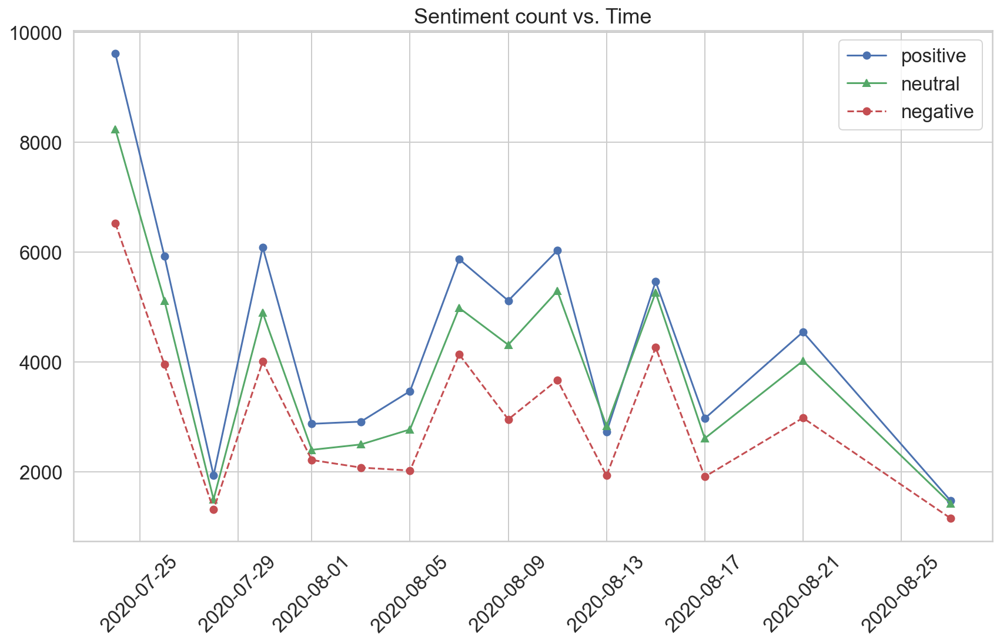

In [48]:
#format sentiment table
times = tweet_count1.loc[tweet_count1['sentiment'] == 'Negative']['created_at'].reset_index(drop = True)
pos = tweet_count1.loc[tweet_count1['sentiment'] == 'Positive']['count'].reset_index(drop = True)
neu = tweet_count1.loc[tweet_count1['sentiment'] == 'Neutral']['count'].reset_index(drop = True)
neg = tweet_count1.loc[tweet_count1['sentiment'] == 'Negative']['count'].reset_index(drop = True)

plt.figure(figsize=(14,8))
plt.xticks(rotation='45')
plt.title("Sentiment count vs. Time")

lin1=plt.plot(times, pos, 'bo-', label='positive')
lin2=plt.plot(times, neu, 'g^-', label='neutral')
lin3=plt.plot(times, neg, 'ro--', label='negative')
plt.legend()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

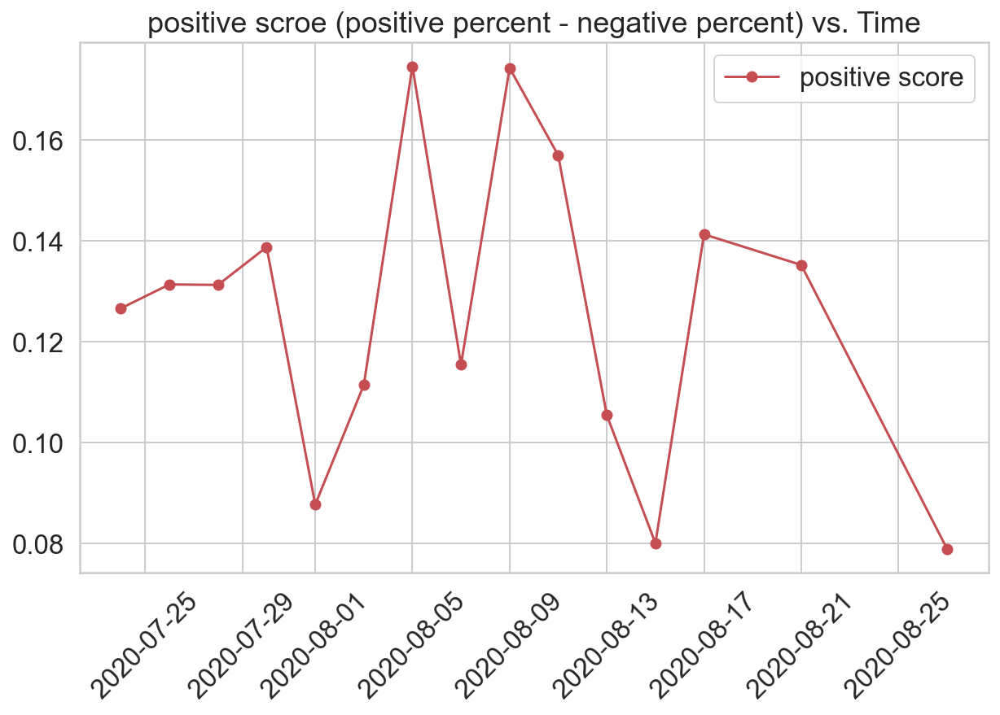

In [49]:
# "score" is defined as percent of positive tweets minus percent of negative tweets
score = (pos - neg) / (pos + neu + neg)

plt.figure(figsize=(10,6))
plt.xticks(rotation='45')
plt.title("positive scroe (positive percent - negative percent) vs. Time")

lin1=plt.plot(times, score, 'ro-', label='positive score')
plt.legend()
plt.show

(-0.5, 399.5, 199.5, -0.5)

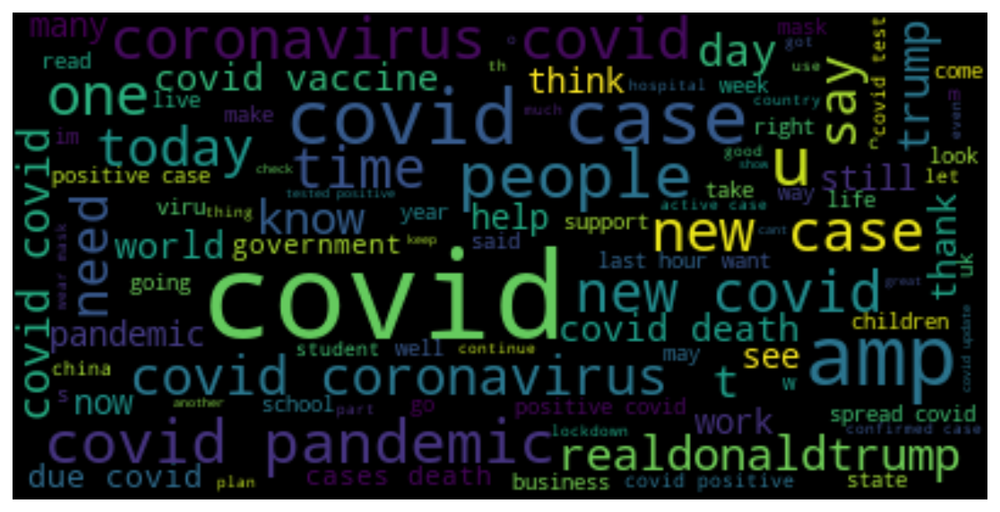

In [50]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [51]:
df_new['text']

0         ghana path easing restrictions public gatherin...
1         breaking news boris johnson vows personally ad...
2         fact check another trump briefing trump falseh...
3         it took pandemic shake indians wear mask when ...
4         face shields worn hairdressers salon workers d...
                                ...                        
179103    mmaltaisla usatodaymoney our data shows consum...
179104    people recovered corona today total corona vir...
179105    this man deserves no credit the media needs st...
179106        it is right realdonaldtrump roberttrump covid
179107    here latest covid numbers tennessee showing ch...
Name: text, Length: 179108, dtype: object

In [52]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,70187
1,Neutral,61318
0,Negative,47603


<AxesSubplot:xlabel='sentiment', ylabel='count'>

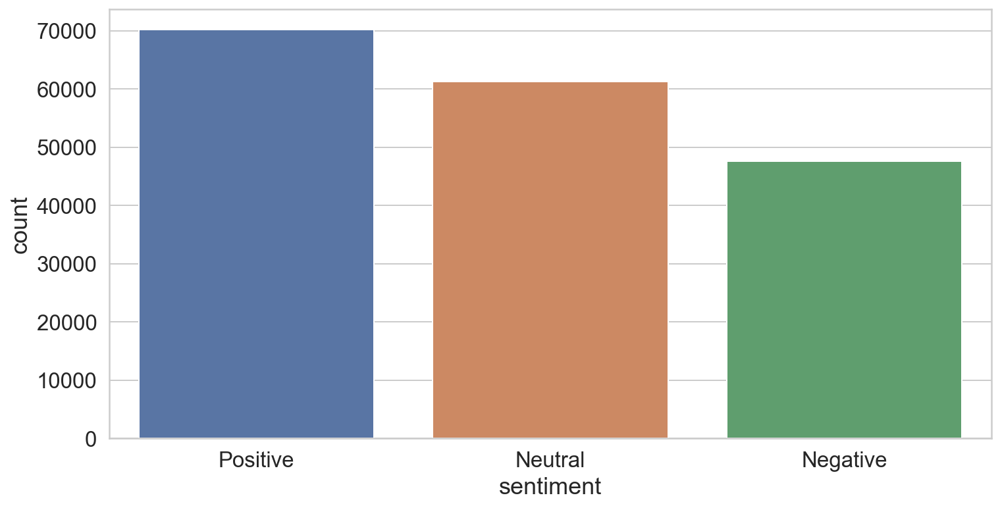

In [53]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [54]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

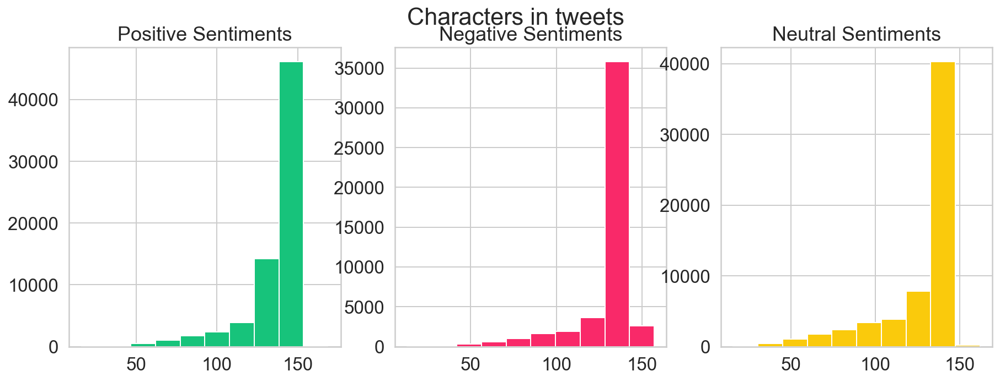

In [55]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

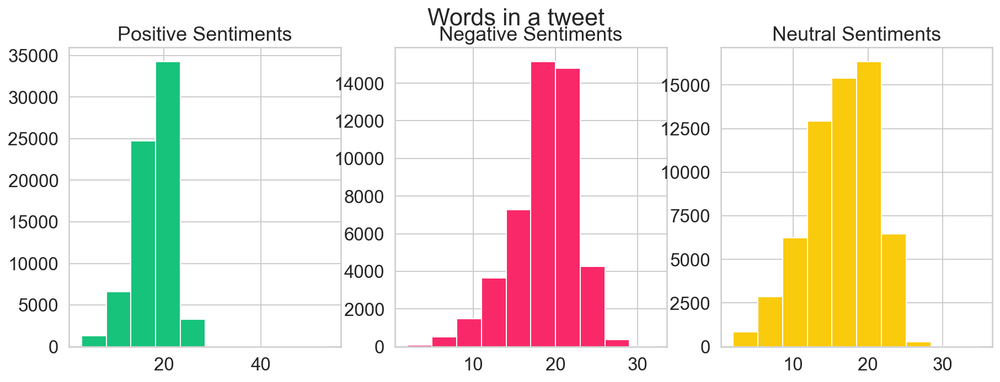

In [56]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

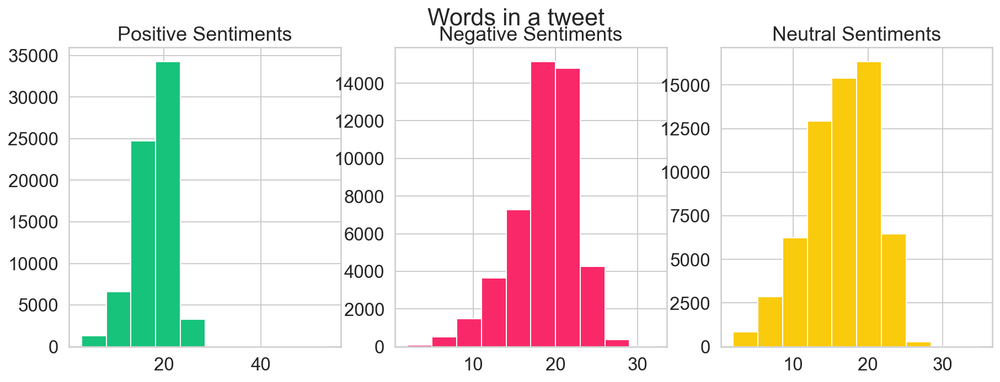

In [57]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

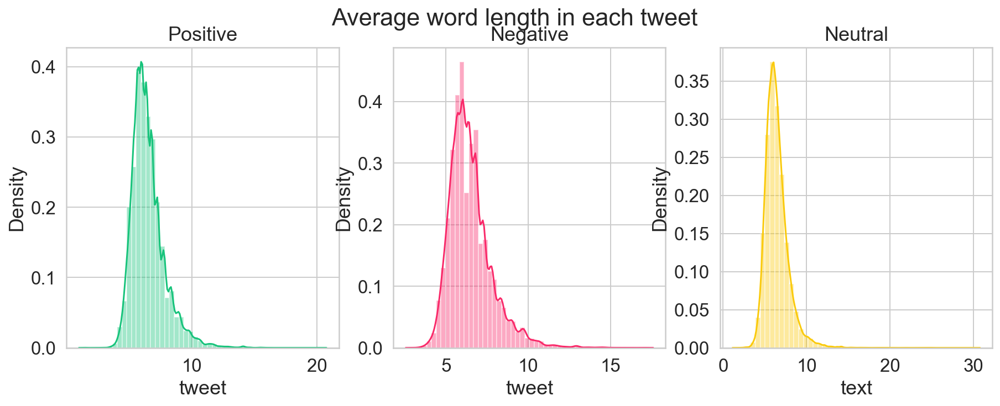

In [58]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [59]:
np.array(stopwords)

array({'up', "should've", 'further', "don't", 't', 'so', 'myself', 'by', 'he', 'y', 'doing', "isn't", "didn't", 'yours', 'mightn', 'why', 'shan', 'that', 'be', 'against', 'just', 'to', 'him', 'until', 'does', 'each', 'itself', 'as', 'here', 'with', "shouldn't", "wouldn't", 'won', 're', 'which', 'wasn', "weren't", 'this', 'between', 'before', 'of', 'more', 'not', 'aren', 'yourself', 'whom', "mustn't", 'a', 'is', 'off', 'i', 'all', 'these', 'didn', 'are', 'down', 'been', 'again', 'hers', 'his', 'have', 'over', 'can', 'my', 've', "that'll", 'those', 'where', 'at', 'couldn', "you're", 'in', 'into', 'll', "needn't", 'how', 'himself', 'am', 'should', 'when', 'theirs', 'because', 'ours', 'no', 'now', 'out', 'doesn', 'but', 'on', "mightn't", 'your', "doesn't", "shan't", 'nor', 'do', 'ma', 'same', "won't", 'she', 'and', 'having', 'both', 'their', 'below', 'isn', "you'd", 'we', 'd', 'they', 'once', 'weren', 'its', "you'll", 'then', 'ain', 'herself', "hadn't", 'after', 'will', 'above', 'an', 'had

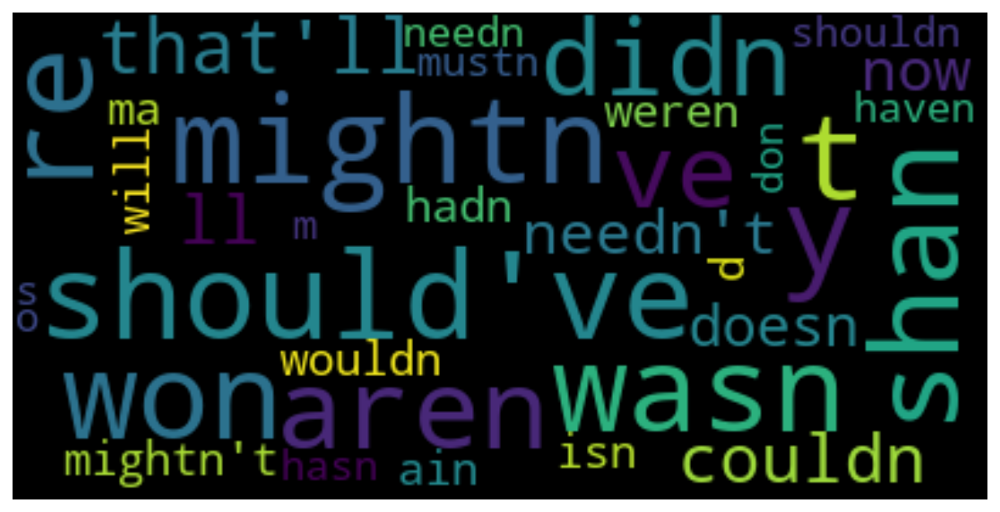

In [60]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 

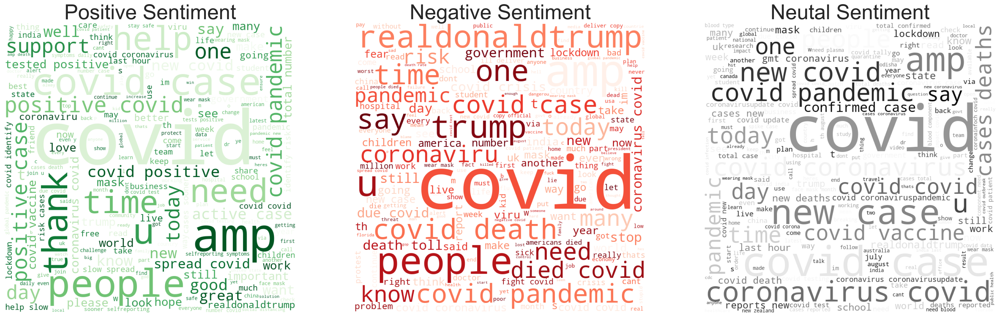

In [61]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [62]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

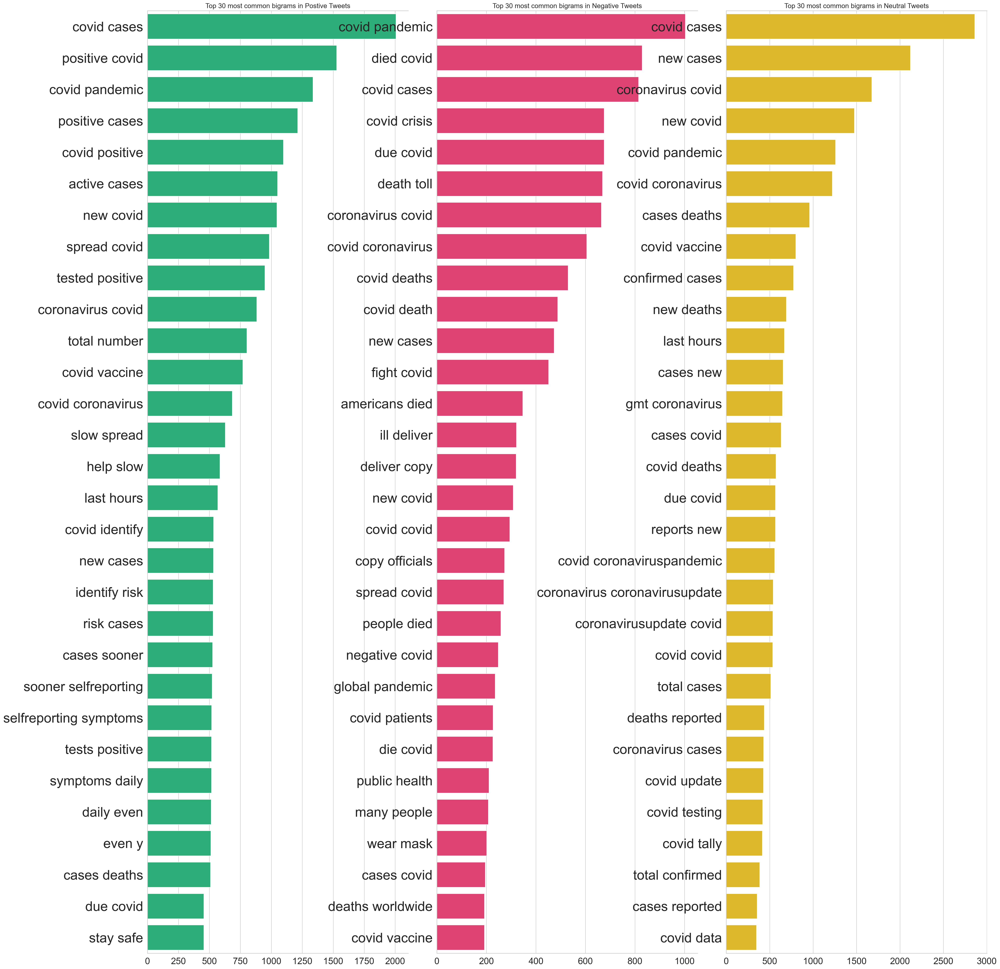

In [63]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

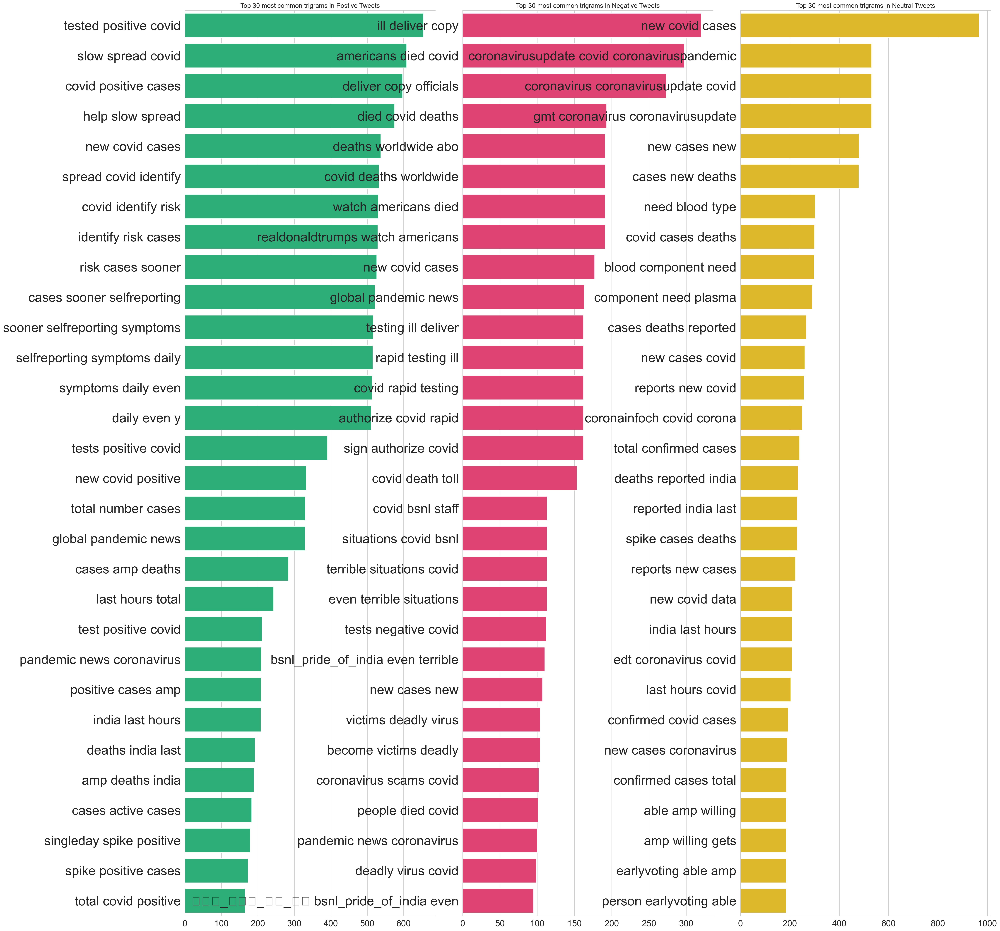

In [64]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [65]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [66]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,user_name,tweet,tweets_count,date,time,text,sentiment,created_at
0,@Event21_Magana,Looking for a good way to break the ice at you...,1,2020-08-17,06:29:43,looking good way break ice next event home par...,Positive,2020-08-15
1,Dawn Hunter,Could more states follow suit? Doing so may en...,1,2020-08-10,15:15:55,could states follow suit doing may ensure equi...,Positive,2020-08-09
2,Aaditya Arya,During this #COVID19 pandemic Govt before cond...,1,2020-08-08,11:54:53,during covid pandemic govt conducting exams li...,Positive,2020-08-07
3,Connecting the Dots,@ForeignAffairs Those who took precautions wen...,1,2020-07-29,16:14:55,foreignaffairs those took precautions went ny ...,Positive,2020-07-28
4,Tip Top Vapor,"@realDonaldTrump The small, independent vapor ...",1,2020-08-29,20:47:41,realdonaldtrump the small independent vapor bu...,Positive,2020-08-27


In [67]:
print(df_new)

                  user_name  \
0           @Event21_Magana   
1               Dawn Hunter   
2              Aaditya Arya   
3       Connecting the Dots   
4             Tip Top Vapor   
...                     ...   
137242              XenZone   
137243            rainmaker   
137244           KetoMaster   
137245          jason quinn   
137246       VB Enviro Care   

                                                    tweet  tweets_count  \
0       Looking for a good way to break the ice at you...             1   
1       Could more states follow suit? Doing so may en...             1   
2       During this #COVID19 pandemic Govt before cond...             1   
3       @ForeignAffairs Those who took precautions wen...             1   
4       @realDonaldTrump The small, independent vapor ...             1   
...                                                   ...           ...   
137242  Our new #data release is out taking a look at ...             1   
137243  Thank You for your 

<AxesSubplot:xlabel='sentiment', ylabel='count'>

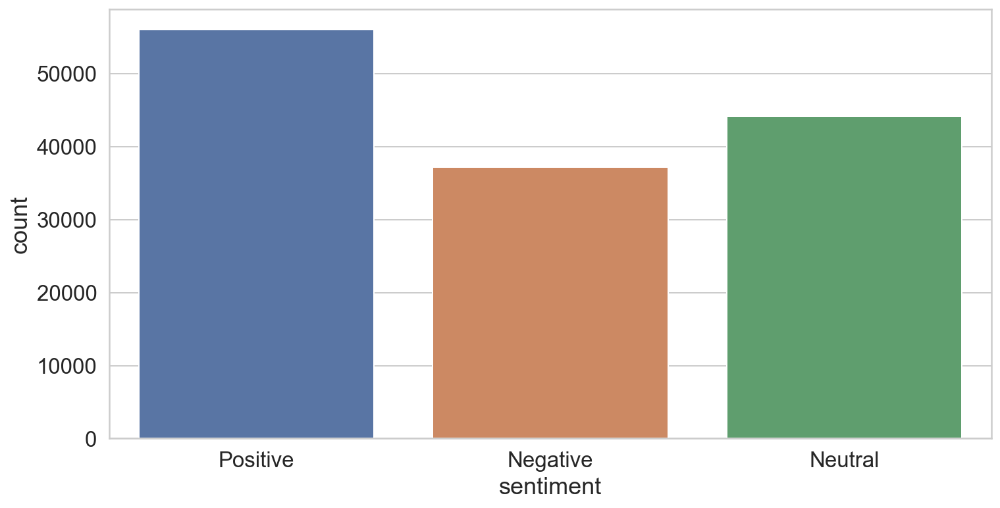

In [68]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [69]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

In [70]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [71]:
len(df_new_final)

40000

In [72]:
export_csv = df_neg.to_csv(r'covid19 july tweets.csv')